In [63]:
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.linear_model import LinearRegression
from scipy.ndimage import gaussian_filter1d
from pandas import DataFrame, Series
import matplotlib.pylab as plt
import seaborn as sns 
import pandas as pd
import numpy as np
import datetime
import pyproj 
import random
import os
import io

%matplotlib inline
np.set_printoptions(precision=3 , suppress= True)

In [57]:
#initial parameters - path
folder_path = '/home/rafaela/internship/time_series/TimeSeries-insar/egm_files'
file_path = os.path.join(folder_path, 'EGMS_L3_E44N25_100km_U.csv')
teste = pd.read_csv(file_path)

teste_reduced = teste.iloc[:,list(range(1, 4)) + list(range(11, 375))]
print(teste_reduced)

        easting  northing  height  20160105  20160111  20160117  20160123  \
0       4499150   2596450  2186.4       3.2       5.2       3.7       1.6   
1       4499350   2596550  2060.1       4.3       2.8       2.5       2.9   
2       4499150   2596550  2112.4      -2.2      -2.0      -1.5      -2.1   
3       4498950   2596550  2075.7      -1.2      -1.7      -1.4      -0.9   
4       4498850   2596550  2024.0       1.4       1.7      -1.9      -2.3   
...         ...       ...     ...       ...       ...       ...       ...   
209839  4415850   2516650   565.8      -1.0      -0.2       0.0       0.8   
209840  4415950   2516650   563.0       1.0       0.5       0.5       0.9   
209841  4416050   2516650   551.3       0.8       1.4       1.2      -0.2   
209842  4416150   2516650   537.0      -1.5      -3.2      -3.1       1.0   
209843  4416250   2516750   535.2      -3.2      -1.8      -1.2       0.1   

        20160129  20160204  20160210  ...  20211029  20211104  20211110  \


In [58]:
#define the ETRS89-LAEA and the UTM projection
etrs89_laea = pyproj.CRS("EPSG:3035")
wgs84 = pyproj.CRS("EPSG:4326")
utm_32 = pyproj.CRS("EPSG:23032")

In [59]:
teste_new = teste_reduced.copy()

transformer = pyproj.Transformer.from_crs(etrs89_laea, wgs84)
teste_new["latitude"], teste_new["longitude"] = transformer.transform(teste_new["northing"].to_numpy(), teste_new["easting"].to_numpy())

print(teste_new)

        easting  northing  height  20160105  20160111  20160117  20160123  \
0       4499150   2596450  2186.4       3.2       5.2       3.7       1.6   
1       4499350   2596550  2060.1       4.3       2.8       2.5       2.9   
2       4499150   2596550  2112.4      -2.2      -2.0      -1.5      -2.1   
3       4498950   2596550  2075.7      -1.2      -1.7      -1.4      -0.9   
4       4498850   2596550  2024.0       1.4       1.7      -1.9      -2.3   
...         ...       ...     ...       ...       ...       ...       ...   
209839  4415850   2516650   565.8      -1.0      -0.2       0.0       0.8   
209840  4415950   2516650   563.0       1.0       0.5       0.5       0.9   
209841  4416050   2516650   551.3       0.8       1.4       1.2      -0.2   
209842  4416150   2516650   537.0      -1.5      -3.2      -3.1       1.0   
209843  4416250   2516750   535.2      -3.2      -1.8      -1.2       0.1   

        20160129  20160204  20160210  ...  20211110  20211116  20211122  \


In [60]:
latitude_min = 46.050
latitude_max = 46.150
longitude_min = 12.030
longitude_max = 12.130

teste_area_selected = teste_new[((teste_new['latitude'] > latitude_min) & (teste_new['latitude'] < latitude_max) &
                  (teste_new['longitude'] > longitude_min) & (teste_new['longitude'] < longitude_max))]

print(teste_area_selected)

       easting  northing  height  20160105  20160111  20160117  20160123  \
59270  4478550   2554150   309.9      -0.4       0.3       0.4       0.3   
59271  4479150   2554150   300.9       0.3       0.1       0.5       0.8   
59272  4479650   2554150   294.4      -0.0       0.3       0.2       0.5   
59273  4479250   2554150   299.9       0.0       0.1       0.7       0.9   
59274  4478650   2554150   309.7      -0.0       0.2       0.2       0.1   
...        ...       ...     ...       ...       ...       ...       ...   
68995  4483850   2555750   297.7      -2.1      -0.0       0.4       1.2   
68996  4484350   2555750   306.8       0.1       0.5      -0.6      -0.6   
68997  4482950   2555750   298.6       0.3       0.5       0.4       0.5   
68998  4483350   2555750   296.1       0.2      -0.1      -0.1       0.5   
68999  4484050   2555750   297.5       0.7       0.5       0.9       1.0   

       20160129  20160204  20160210  ...  20211110  20211116  20211122  \
59270       0

In [71]:
def selec_points(teste_area_selected, indice_number):
    teste_point = teste_area_selected.iloc[indice_number, 3:367]
    teste_point.index = pd.to_datetime(teste_point.index, format='%Y%m%d')
    points_dataframe = pd.DataFrame(teste_point, columns=[teste_point.name])
    return points_dataframe
    
num_points = 80
indicies = random.choices(range(len(teste_area_selected)), k = num_points)
points_dictionaire = {}
    
for indice_number in indicies:
    points_dataframe = selec_points(teste_area_selected, indice_number)
    points_dictionaire[indice_number] = points_dataframe

print(points_dictionaire)

{1487:             66638
2016-01-05   -0.2
2016-01-11    1.1
2016-01-17    1.4
2016-01-23   -0.2
2016-01-29   -0.7
...           ...
2021-11-28   -0.3
2021-12-04   -0.0
2021-12-10    1.0
2021-12-16    2.3
2021-12-22    1.6

[364 rows x 1 columns], 2462:             68018
2016-01-05    0.5
2016-01-11    0.2
2016-01-17   -0.4
2016-01-23   -0.4
2016-01-29    0.3
...           ...
2021-11-28   -9.9
2021-12-04   -9.7
2021-12-10   -9.2
2021-12-16   -8.1
2021-12-22   -8.7

[364 rows x 1 columns], 1600:             66833
2016-01-05   -2.3
2016-01-11    0.4
2016-01-17   -1.2
2016-01-23   -3.0
2016-01-29   -4.3
...           ...
2021-11-28   -2.5
2021-12-04   -5.7
2021-12-10   -0.1
2021-12-16   10.2
2021-12-22    1.7

[364 rows x 1 columns], 1982:             67343
2016-01-05    0.3
2016-01-11   -1.0
2016-01-17   -0.2
2016-01-23    0.1
2016-01-29    0.1
...           ...
2021-11-28    0.3
2021-12-04    2.3
2021-12-10   -3.4
2021-12-16   -0.8
2021-12-22    0.2

[364 rows x 1 columns], 929:       

In [73]:
print(indicies)

[1487, 2462, 1600, 1982, 929, 413, 2856, 1645, 1635, 894, 606, 2967, 266, 636, 263, 2166, 2186, 103, 499, 1214, 1734, 2096, 3007, 1359, 3072, 703, 2739, 2886, 1495, 1279, 2206, 1109, 238, 1180, 2988, 982, 2212, 2589, 14, 2753, 3160, 3123, 515, 1629, 2005, 2531, 1943, 1277, 621, 2506, 2570, 1039, 2699, 3136, 813, 2812, 1122, 687, 1448, 2029, 2112, 1346, 2548, 953, 1225, 954, 3018, 2356, 288, 2174, 483, 1339, 2065, 2462, 547, 2661, 914, 1010, 1968, 1259]


In [74]:
def linear_detrend(column_name, indice_data):
 
    #getting the linear model to substract from the original time series:    
    x = np.arange(len(indice_data)).reshape(-1, 1)
    y = indice_data.values.reshape(-1, 1)
    
    linear_model = LinearRegression().fit(x, y)
    regression_line = linear_model.predict(x)
    
    detrended_values = y.flatten() - regression_line.flatten()
    #detrended_values = station_data[f'{station_name}_east(m)'].values - regression_line.flatten()
    
    detrended_dataframe = pd.DataFrame(
        detrended_values, 
        index=indice_data.index, 
        columns=[f'{column_name}_up(mm)_detrended'])
        
    return detrended_dataframe


#dictionaries to store the data
detrended_data_dict = {}

#calling the function
for indice_number, indice_data in points_dictionaire.items():
    
    column_name = indice_data.columns[0]
    detrended_dataframe = linear_detrend(
        column_name, 
        indice_data)
    detrended_data_dict[column_name] = detrended_dataframe
    

#printing dataframe
#stations detrended
for indice_number, indice_data in detrended_data_dict.items():
    print(f'{indice_number}: \n{indice_data}\n')

66638: 
            66638_up(mm)_detrended
2016-01-05               -1.105391
2016-01-11                0.194273
2016-01-17                0.493936
2016-01-23               -1.106400
2016-01-29               -1.606737
...                            ...
2021-11-28               -1.326230
2021-12-04               -1.026567
2021-12-10               -0.026903
2021-12-16                1.272760
2021-12-22                0.572424

[364 rows x 1 columns]

68018: 
            68018_up(mm)_detrended
2016-01-05                0.246894
2016-01-11               -0.028166
2016-01-17               -0.603227
2016-01-23               -0.578288
2016-01-29                0.146651
...                            ...
2021-11-28               -1.199948
2021-12-04               -0.975009
2021-12-10               -0.450069
2021-12-16                0.674870
2021-12-22                0.099809

[364 rows x 1 columns]

66833: 
            66833_up(mm)_detrended
2016-01-05               -2.145934
2016-01-11      

In [75]:
def remove_outliers(indice_number, indice_data):
    limiar_z = 3.0
    
    
    selecting_outliers = indice_data[(np.abs(indice_data-indice_data.mean()) 
                                              < limiar_z*indice_data.std())]
    
    
    outliers_removed_dataframe = pd.DataFrame(selecting_outliers, 
                                              index=indice_data.index)
    
    outliers_removed_dataframe = outliers_removed_dataframe.rename(
        columns={f'{indice_number}_up(mm)_detrended':f'{indice_number}_up(mm)'})  
    
    outliers_removed_dataframe.dropna(inplace=True)
    
    return outliers_removed_dataframe

#dictionaries to store the data
area_outliers_removed_dict = {}

#calling the function
for indice_number, indice_data in detrended_data_dict.items():
    outliers_removed_dataframe = remove_outliers(
        indice_number, 
        indice_data)
    area_outliers_removed_dict[indice_number] = outliers_removed_dataframe

#printing dataframe
#stations detrended
for indice_number, indice_data in area_outliers_removed_dict.items():
    print(f'{indice_number}: \n{indice_data}\n')

66638: 
            66638_up(mm)
2016-01-05     -1.105391
2016-01-11      0.194273
2016-01-17      0.493936
2016-01-23     -1.106400
2016-01-29     -1.606737
...                  ...
2021-11-28     -1.326230
2021-12-04     -1.026567
2021-12-10     -0.026903
2021-12-16      1.272760
2021-12-22      0.572424

[362 rows x 1 columns]

68018: 
            68018_up(mm)
2016-01-05      0.246894
2016-01-11     -0.028166
2016-01-17     -0.603227
2016-01-23     -0.578288
2016-01-29      0.146651
...                  ...
2021-11-28     -1.199948
2021-12-04     -0.975009
2021-12-10     -0.450069
2021-12-16      0.674870
2021-12-22      0.099809

[361 rows x 1 columns]

66833: 
            66833_up(mm)
2016-01-05     -2.145934
2016-01-11      0.558254
2016-01-17     -1.037557
2016-01-23     -2.833368
2016-01-29     -4.129180
...                  ...
2021-11-22     -2.946437
2021-11-28     -0.842249
2021-12-04     -4.038060
2021-12-10      1.566128
2021-12-22      3.374505

[353 rows x 1 columns]

6

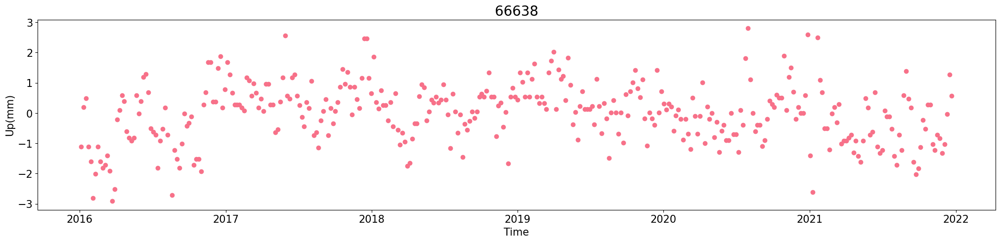

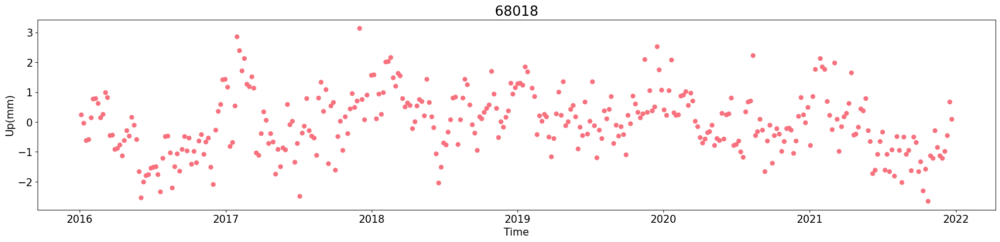

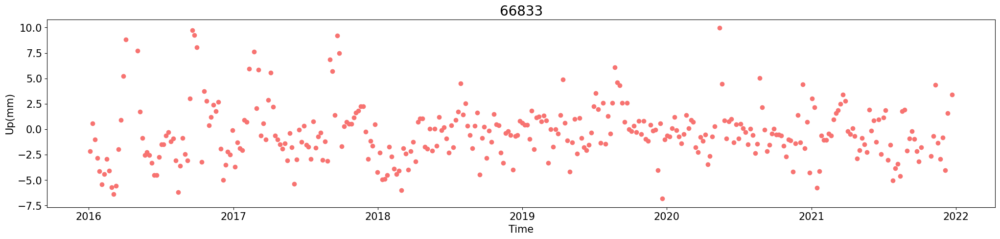

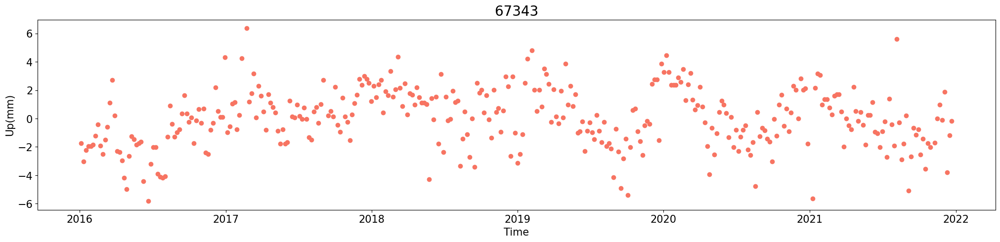

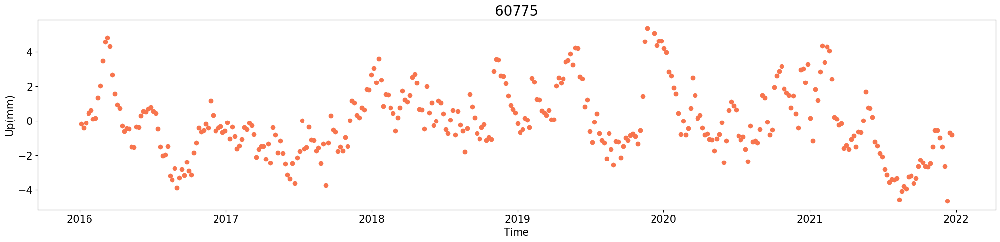

...

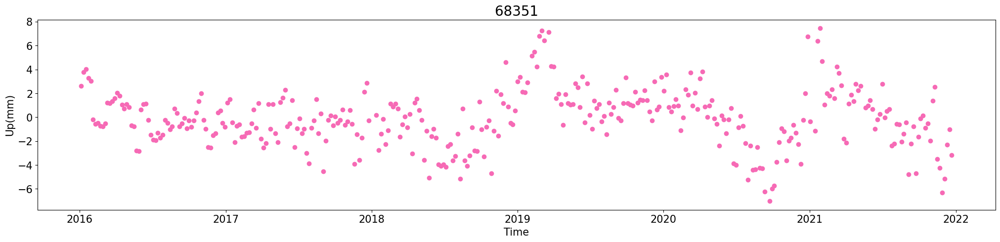

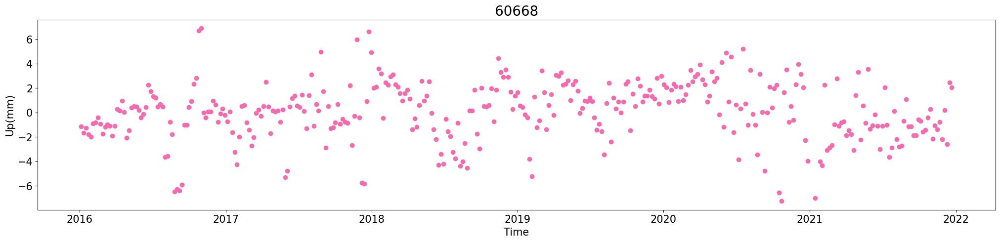

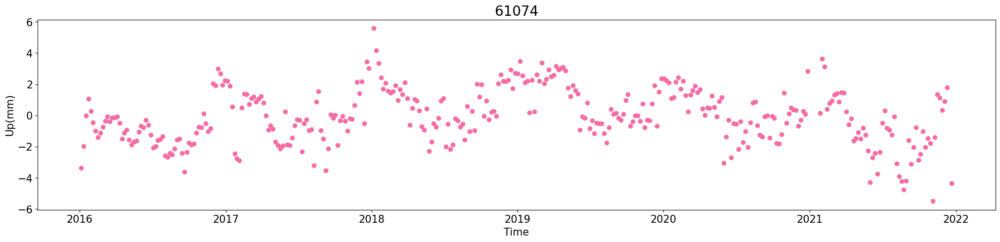

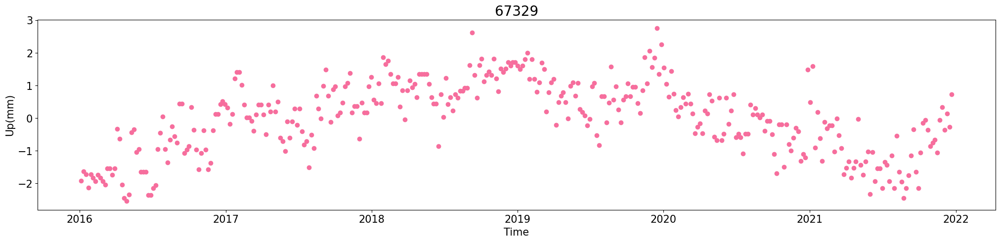

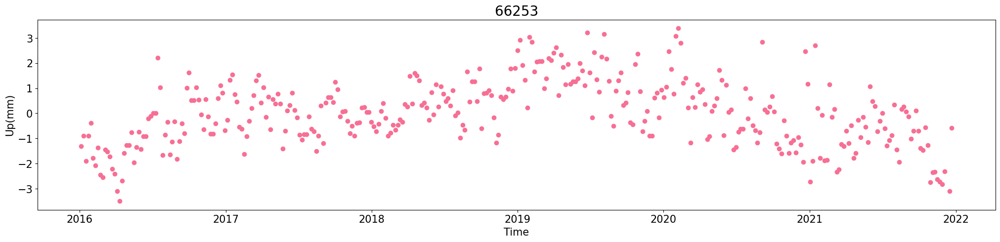

In [76]:
#checking the areas's plots - brse detrended

colors = sns.color_palette("husl", len(area_outliers_removed_dict))
#folder = ''

for i, (indice_number, indice_data) in enumerate(area_outliers_removed_dict.items()):
    plt.figure(figsize=(25, 5))
    
    plt.plot(indice_data.index, indice_data, 'o', color = colors[i])
    plt.title(f'{indice_number}', fontsize = 20)
    plt.xlabel('Time', fontsize = 15)
    plt.xticks(fontsize=15)
    plt.ylabel('Up(mm)', fontsize = 15)
    plt.yticks(fontsize=15)
    #plt.ylim(-0.008,0.008)
   
    #fl = os.path.join(folder, f'{indice_number}.svg')
    #f = io.BytesIO()
    #plt.savefig(fl, format="svg")

    plt.show()

In [77]:
def get_rolling_mean(indice_number, indice_data):
    
    area_rolling_mean = indice_data.rolling(2, min_periods=1).mean()
    
    areas_rolling_mean_dataframe = pd.DataFrame(area_rolling_mean, 
                                              index=indice_data.index)
    
    areas_rolling_mean_dataframe = areas_rolling_mean_dataframe.rename(
        columns={f'{indice_number}_up(mm)':f'{indice_number}_up(mm)_rm'})
    
    areas_rolling_mean_dataframe.dropna(inplace=True)
    
    return areas_rolling_mean_dataframe

#dictionaries to store the data
areas_rolling_mean_dict = {}

#calling the function
for indice_number, indice_data in area_outliers_removed_dict.items():
    areas_rolling_mean_dataframe = get_rolling_mean(indice_number, indice_data)
    areas_rolling_mean_dict[indice_number] = areas_rolling_mean_dataframe

#printing dataframe
#stations detrended
for indice_number, indice_data in areas_rolling_mean_dict.items():
    print(f'{indice_number}: \n{indice_data}\n')

66638: 
            66638_up(mm)_rm
2016-01-05        -1.105391
2016-01-11        -0.455559
2016-01-17         0.344104
2016-01-23        -0.306232
2016-01-29        -1.356569
...                     ...
2021-11-28        -1.076062
2021-12-04        -1.176398
2021-12-10        -0.526735
2021-12-16         0.622929
2021-12-22         0.922592

[362 rows x 1 columns]

68018: 
            68018_up(mm)_rm
2016-01-05         0.246894
2016-01-11         0.109364
2016-01-17        -0.315697
2016-01-23        -0.590758
2016-01-29        -0.215818
...                     ...
2021-11-28        -1.162417
2021-12-04        -1.087478
2021-12-10        -0.712539
2021-12-16         0.112400
2021-12-22         0.387339

[361 rows x 1 columns]

66833: 
            66833_up(mm)_rm
2016-01-05        -2.145934
2016-01-11        -0.793840
2016-01-17        -0.239651
2016-01-23        -1.935463
2016-01-29        -3.481274
...                     ...
2021-11-22        -2.148531
2021-11-28        -1.894343
20

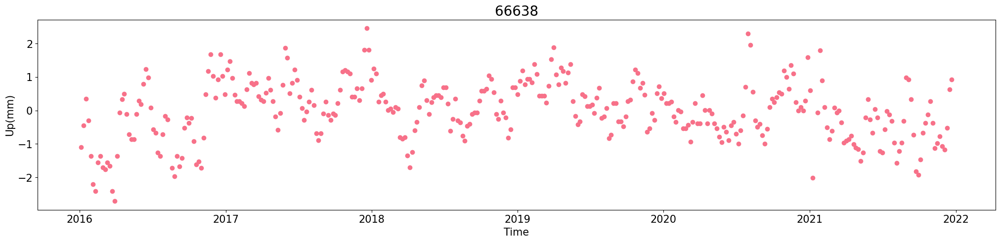

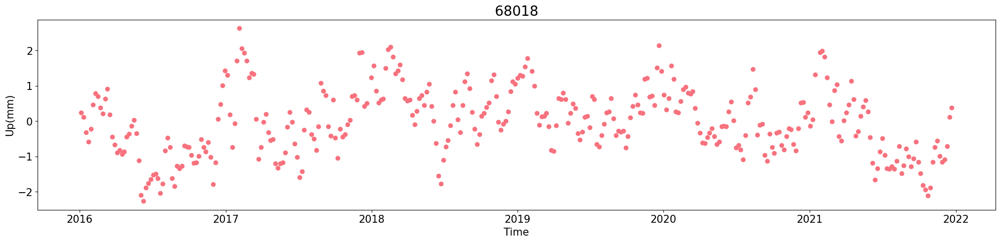

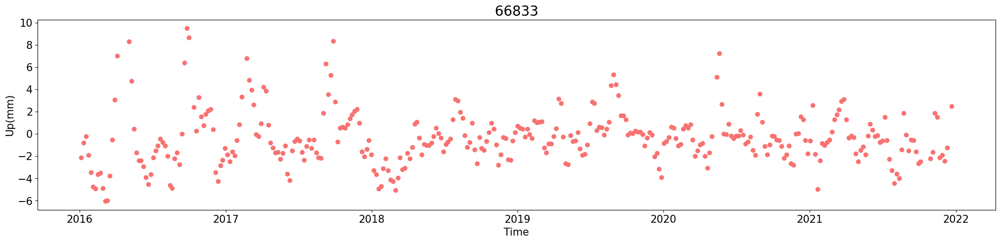

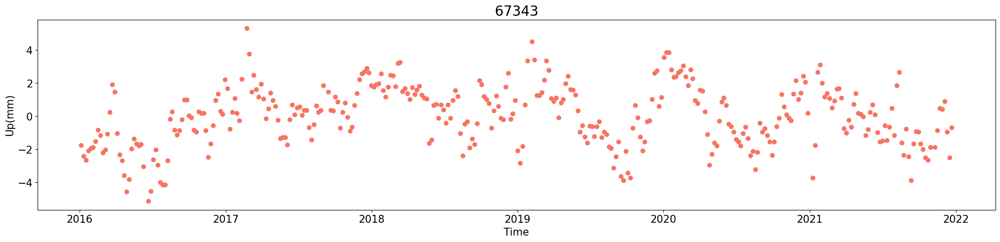

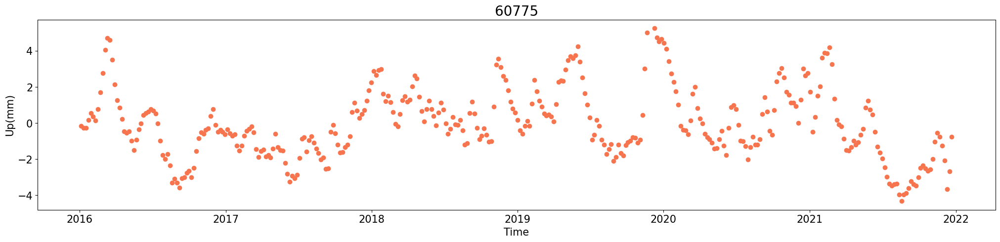

...

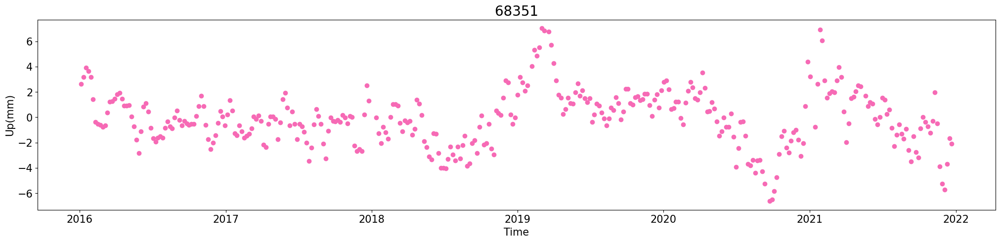

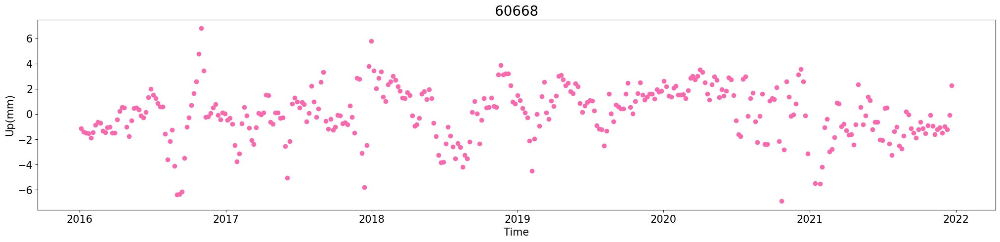

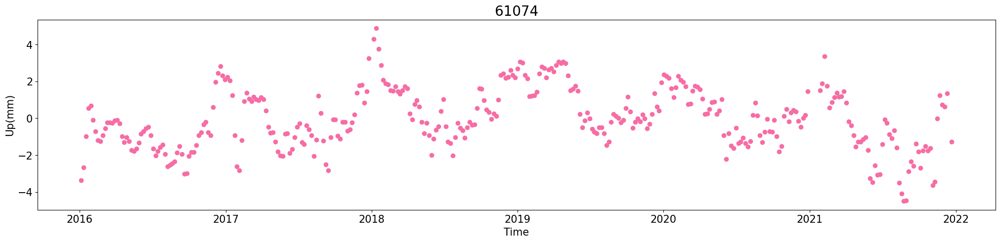

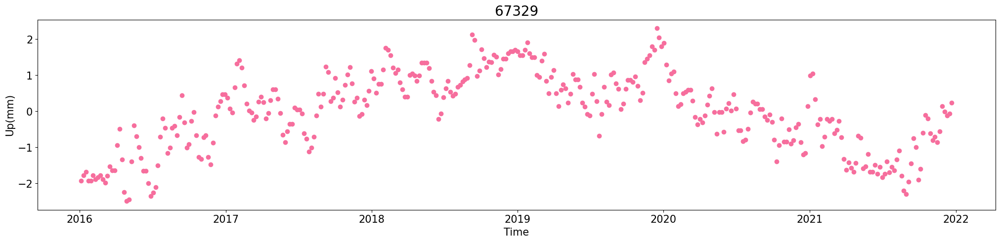

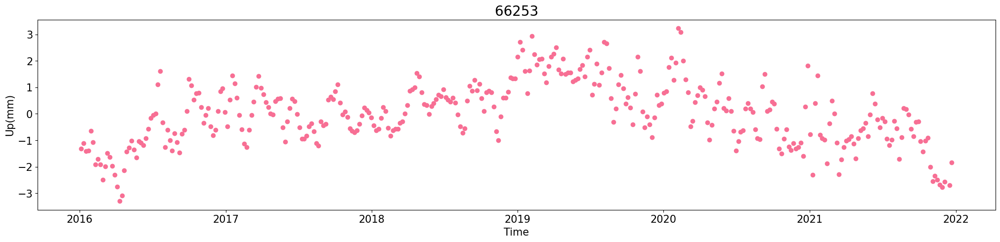

In [84]:
#checking the areas's plots - rolling mean

colors = sns.color_palette("husl", len(areas_rolling_mean_dict))
folder = '/home/rafaela/internship/time_series/TimeSeries-insar/egm_files/insar_ts_plots/points_rolling_mean/up'

for i, (indice_number, indice_data) in enumerate(areas_rolling_mean_dict.items()):
    plt.figure(figsize=(25, 5))
    
    plt.plot(indice_data.index, indice_data, 'o', color = colors[i])
    plt.title(f'{indice_number}', fontsize = 20)
    plt.xlabel('Time', fontsize = 15)
    plt.xticks(fontsize=15)
    plt.ylabel('Up(mm)', fontsize = 15)
    plt.yticks(fontsize=15)
    #plt.ylim(-0.008,0.008)
   
    fl = os.path.join(folder, f'{indice_number}.svg')
    f = io.BytesIO()
    plt.savefig(fl, format="svg")

    plt.show()

In [40]:
target_index = 67813
closest_data = teste_area_selected.loc[target_index]
print(closest_data)

easting      4.482650e+06
northing     2.556450e+06
height       3.044000e+02
20160105    -8.000000e-01
20160111     0.000000e+00
                 ...     
20211210     1.400000e+00
20211216     2.300000e+00
20211222     1.200000e+00
latitude     4.610063e+01
longitude    1.208837e+01
Name: 67813, Length: 369, dtype: float64


In [85]:
#checking all point together:

#colors = sns.color_palette("husl", len(areas_rolling_mean_dict))
#folder = ''

#plt.figure(figsize=(35, 15))

#for i, (indice_number, indice_data) in enumerate(areas_rolling_mean_dict.items()):
    #plt.plot(indice_data.index, indice_data, label = f'{indice_number}', color=colors[i], lw=1.5)

#plt.title('Rolling Mean - All Points', fontsize=30)
#plt.xlabel('Time', fontsize=20)
#plt.xticks(fontsize=20)
#plt.ylabel('Up(mm)', fontsize=20)
#plt.yticks(fontsize=20)
#plt.xlim(pd.Timestamp('2011-01-15'), pd.Timestamp('2018-10-15'))
#plt.legend()

#fl = os.path.join(folder, 'rm_all_points_EAST.svg')
#plt.savefig(fl, format="svg")

#plt.show()

In [80]:
#getting the average for all points rolling mean
all_rm_data = pd.DataFrame()

for indice_number, indice_data in areas_rolling_mean_dict.items():
    all_rm_data[indice_number] = indice_data.squeeze()
    
avg_rm = all_rm_data.mean(axis=1).rolling(2, min_periods=1).mean()
print(avg_rm)

2016-01-05   -1.415572
2016-01-11   -1.355284
2016-01-17   -1.188733
2016-01-23   -0.993618
2016-01-29   -0.902123
                ...   
2021-11-28   -0.813919
2021-12-04   -0.959582
2021-12-10   -0.990483
2021-12-16   -0.919981
2021-12-22   -0.868028
Length: 362, dtype: float64


In [81]:
#removing the average rolling mean from each point
points_avgrm_reduced = pd.DataFrame()

for indice_number, indice_data in areas_rolling_mean_dict.items():
    points_avgrm_reduced[indice_number] = indice_data[f'{indice_number}_up(mm)_rm'] - avg_rm
    
points_avgrm_reduced = points_avgrm_reduced.dropna(axis=0)

print(points_avgrm_reduced)

               66638     68018     66833     67343     60775     59887  \
2016-01-23  0.687386  0.402860 -0.941845 -1.094533  1.159333  1.443108   
2016-01-29 -0.454445  0.686305 -2.579151 -1.031451  1.442648  1.178936   
2016-02-04 -1.226811  1.439215 -3.796991 -0.898903  1.345428  0.734231   
2016-02-16 -0.451306  1.815271 -2.562437  0.286427  1.871225 -0.284945   
2016-02-22 -0.179595  1.562258 -2.336200  0.013052  2.868082 -0.335573   
...              ...       ...       ...       ...       ...       ...   
2021-09-29 -1.036032 -0.275145 -1.799565 -0.068016 -2.113577  0.840062   
2021-10-29  0.994706 -1.168029 -1.502484 -1.162713 -1.857110  0.609100   
2021-11-10 -0.159881  0.227936  2.808262 -0.909761 -0.061404  0.659833   
2021-11-22  0.028643 -0.182989 -1.344164  1.290877  0.027411 -0.996323   
2021-12-04 -0.216816 -0.127896 -1.480572  1.855245 -1.117755 -1.136461   

               68609     66932     66922     60648  ...     67627     60027  \
2016-01-23 -1.497563  0.785186  

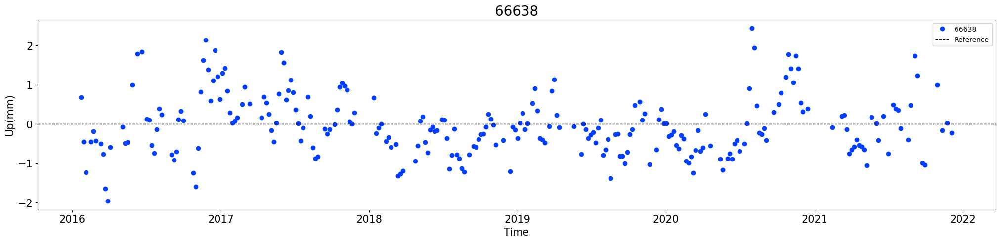

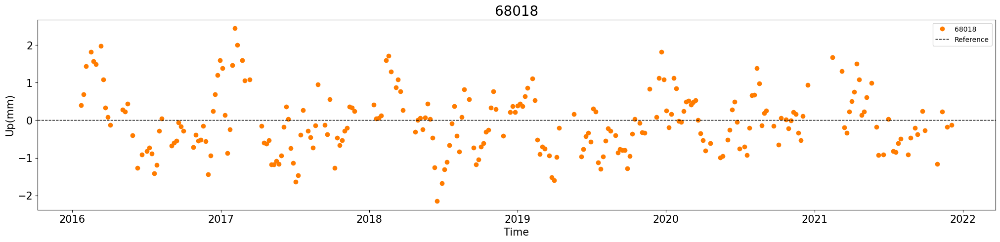

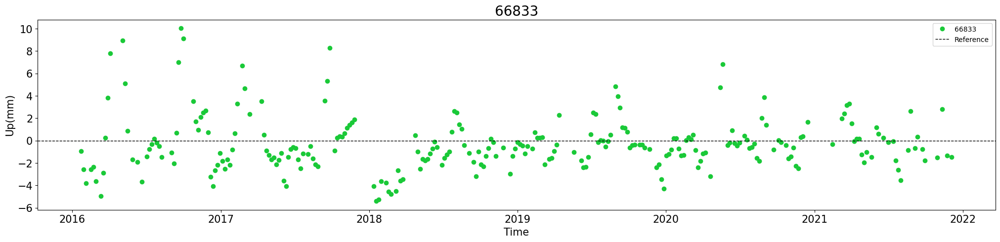

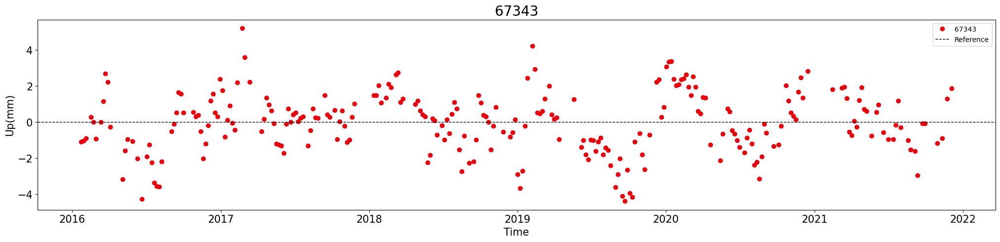

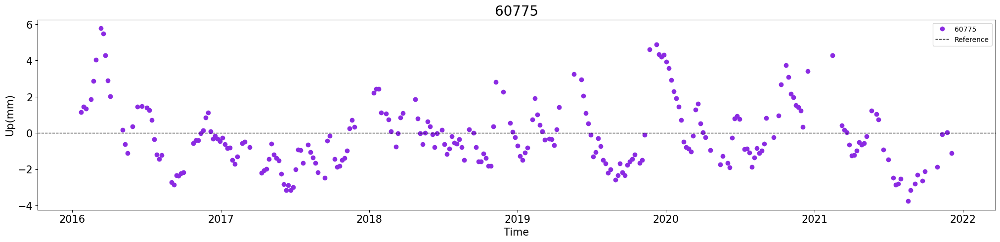

...

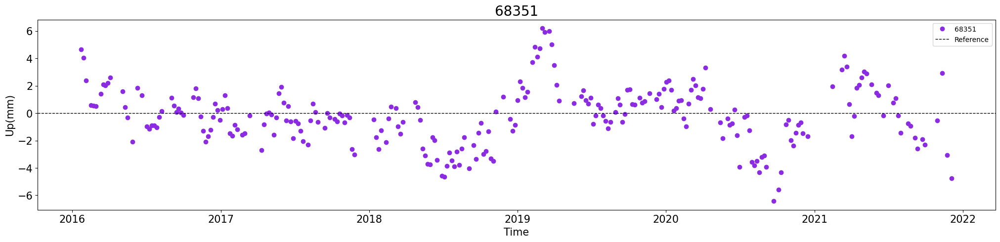

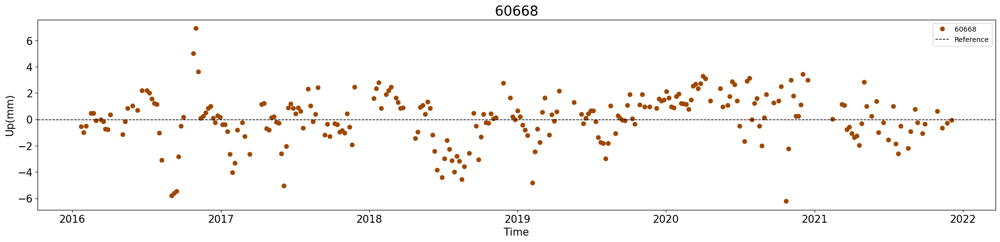

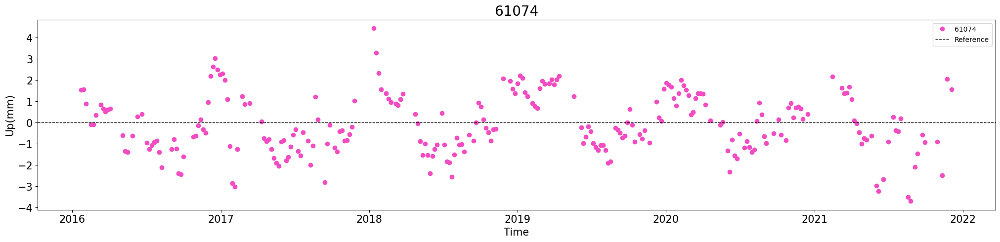

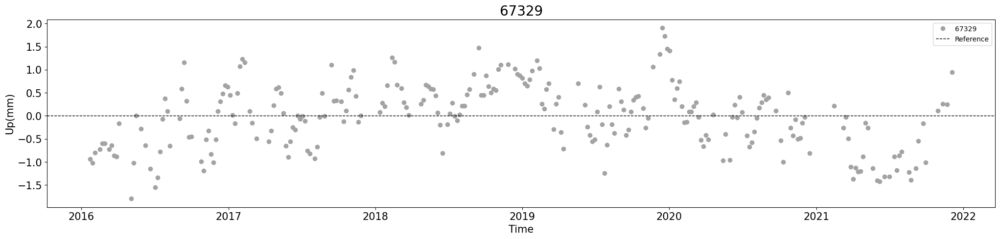

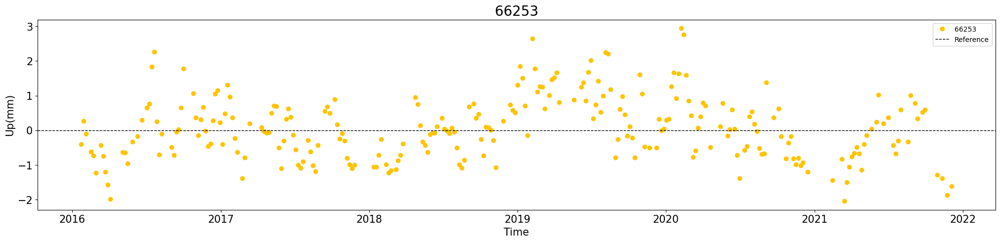

In [83]:
#checking the points plots - AFTER the reduction

colors = sns.color_palette("bright", len(points_avgrm_reduced))
folder = '/home/rafaela/internship/time_series/TimeSeries-insar/egm_files/insar_ts_plots/points_after_avg_rolling_mean/up'

for i, (column, color) in enumerate(zip(points_avgrm_reduced.columns, colors)):
    plt.figure(figsize=(25, 5))
    plt.plot(points_avgrm_reduced.index, points_avgrm_reduced[column], 'o', color=color, lw=2, label=column) 
    
    plt.title(f'{column}', fontsize = 20)
    plt.axhline(y=0, color='black', linestyle='--', linewidth=1, label='Reference')
    plt.xlabel('Time', fontsize = 15)
    plt.xticks(fontsize = 15)
    plt.ylabel('Up(mm)', fontsize = 15)                                       
    plt.yticks(fontsize = 15)
    #plt.ylim(-0.008,0.008)
    #plt.xlim(pd.Timestamp('2011-01-15'), pd.Timestamp('2018-07-15'))

    plt.legend()
    
    fl = os.path.join(folder, f'{column}.svg')
    f = io.BytesIO()
    plt.savefig(fl, format="svg")
    
    plt.show()